**Download DataSet**

In [2]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras 
import requests
import cv2
import glob
import random
import shutil

###reproduciable results
np.random.seed(42)


**Set_HyperParameters**

In [17]:
train=True
epochs=10

**Download Dataset**

In [4]:
%%capture
if not os.path.exists('train'):
    !curl -L "https://app.roboflow.com/ds/BgKawo7ryy?key=HAykKd0N5G" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [5]:
print("length of train images {}".format(len(os.listdir("/content/train/images/"))))
print("length of validation images {}".format(len(os.listdir("/content/valid/images/"))))
print("length of test images {}".format(len(os.listdir("/content/test/images/"))))

length of train images 4916
length of validation images 1413
length of test images 706


**In Case there is no val data**

In [ ]:
def generate_val_datadir():
  if not os.path.exists("/content/val"):
    os.mkdir("/content/val")
    os.mkdir("/content/val/images")
    os.mkdir("/content/val/labels")


  train_images_list=sorted(os.listdir("/content/train/images/"))
  train_labels_list=sorted(os.listdir("/content/train/labels/"))
  val_size=int(0.1*len(os.listdir("/content/train/images/")))
  pairs=list(zip(train_images_list,train_labels_list))
  val_data=random.sample(pairs,val_size)
  images,labels=zip(*val_data)
  images=list(images)
  labels=list(labels)
  [shutil.move("/content/train/images/"+i ,"/content/val/images/") for i in images]
  [shutil.move("/content/train/labels/"+j ,"/content/val/labels/") for j in labels]
  


   

In [ ]:
#generate_val_datadir()

In [ ]:
print("length of train images {}".format(len(os.listdir("/content/train/images/"))))
print("********************************************************************")
print("length of test images {}".format(len(os.listdir("/content/test/images/"))))
print("********************************************************************")
print("length of validation images {}".format(len(os.listdir("/content/valid/images/"))))


length of train images 4743
********************************************************************
length of test images 1766
********************************************************************
length of validation images 526


**Verify validation sample**

In [6]:
def Visualize_samples_of_Data(type_data='train',size=3):
  color_map=[(255,0,0),(0,0,255),(0,255,0)]
  plt.figure(figsize=(15,15))
  if type_data=='train':
    images_path="/content/train/images/"
    labels_path="/content/train/labels/"
    images=sorted(os.listdir(images_path))
    labels=sorted(os.listdir(labels_path))

  if type_data=='test':
    images_path="/content/test/images/"
    labels_path="/content/test/labels/"
    images=sorted(os.listdir(images_path))
    labels=sorted(os.listdir(labels_path))
  if type_data=='val':
    images_path="/content/valid/images/"
    labels_path="/content/valid/labels/"
    images=sorted(os.listdir(images_path))
    labels=sorted(os.listdir(labels_path))
  
  pairs=list(zip(images,labels))
  data=random.sample(pairs,size)
  for image,label in data:
        image_path=images_path+image
        image=cv2.imread(image_path)
        image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        height, width, channels = image.shape
        
        label_path=labels_path+label
        file=open(label_path,'r')
        lines=file.readlines()
        for line in lines:
            clas=int(line.split(" ")[0])
            x=float(line.split(" ")[1])
            y=float(line.split(" ")[2])
            w=float(line.split(" ")[3])
            h=float(line.split(" ")[4])
            X_new=int(x*width)
            Y_new=int(y*height)
            W_new=int(w*width)
            H_new=int(h*height)
            start_x=int(X_new-W_new//2)
            start_y=int(Y_new-H_new//2)
            image=cv2.rectangle(image,(start_x,start_y),(start_x+W_new,start_y+H_new),color_map[clas],3)
        plt.figure()
        plt.imshow(image)

<Figure size 1080x1080 with 0 Axes>

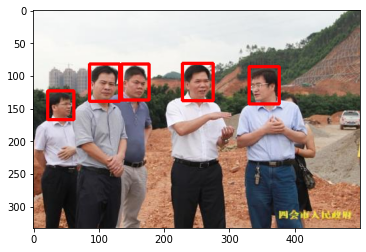

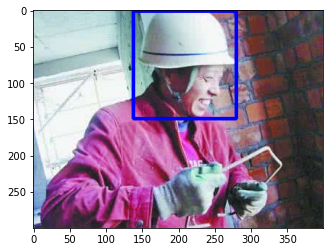

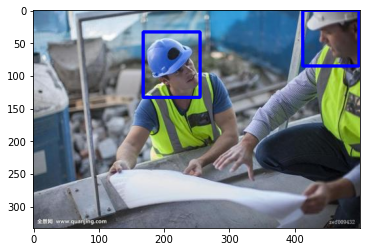

In [7]:
Visualize_samples_of_Data(type_data='val',size=3)

**Helper_Function_to_download_test_videos**

In [8]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)
    else: 
        print('File already present, skipping download...')

**Tensorboard for logging results**

In [9]:
def tensorboard_logging():
  %load_ext tensorboard
  %tensorboard --logdir runs/train 

In [10]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if train:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

**Clone yolo repo**

In [11]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 14513, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 14513 (delta 19), reused 24 (delta 14), pack-reused 14477
Receiving objects: 100% (14513/14513), 13.66 MiB | 30.80 MiB/s, done.
Resolving deltas: 100% (10000/10000), done.


In [12]:
ls

data.yaml  README.roboflow.txt  sample_data/  test/  train/  valid/  yolov5/


In [13]:
%cd yolov5
%ls

/content/yolov5
benchmarks.py    data/       LICENSE          requirements.txt  tutorial.ipynb
CITATION.cff     detect.py   models/          segment/          utils/
classify/        export.py   README.md        setup.cfg         val.py
CONTRIBUTING.md  hubconf.py  README.zh-CN.md  train.py


In [14]:
%%capture
!pip install -r requirements.txt

In [15]:
tensorboard_logging()

<IPython.core.display.Javascript object>

In [20]:
RES_DIR = set_res_dir()
if train:
    !python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {epochs} --batch-size 16 --name {RES_DIR}

Current number of result directories: 0
results_1
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-33-g1752768 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_

In [21]:
def validation_data_predictions():
  path="/content/yolov5/runs/train/results_1/"
  pred_imgs=glob.glob(path+'*_pred.jpg')
  for img in pred_imgs:
    image=cv2.imread(img)
    plt.figure()
    plt.figure(figsize=(15,15))
    plt.imshow(image[:,:,::-1])

<Figure size 432x288 with 0 Axes>

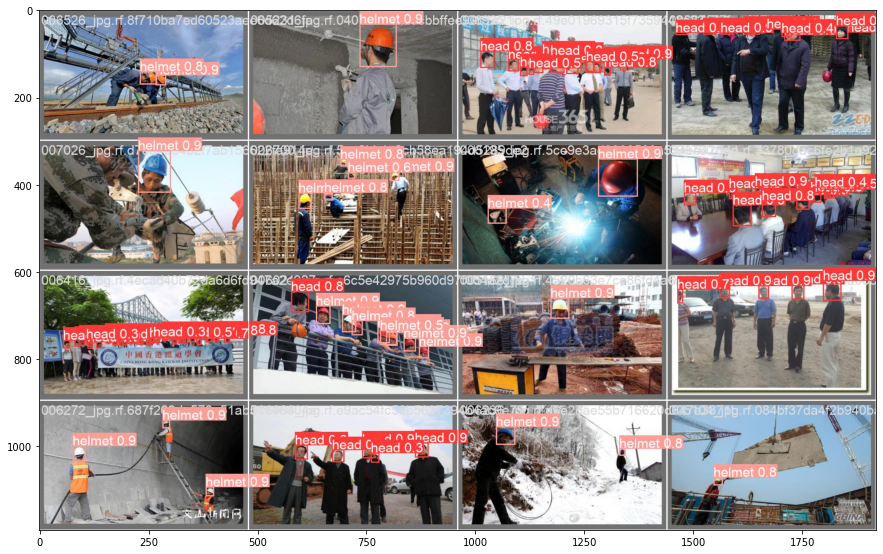

<Figure size 432x288 with 0 Axes>

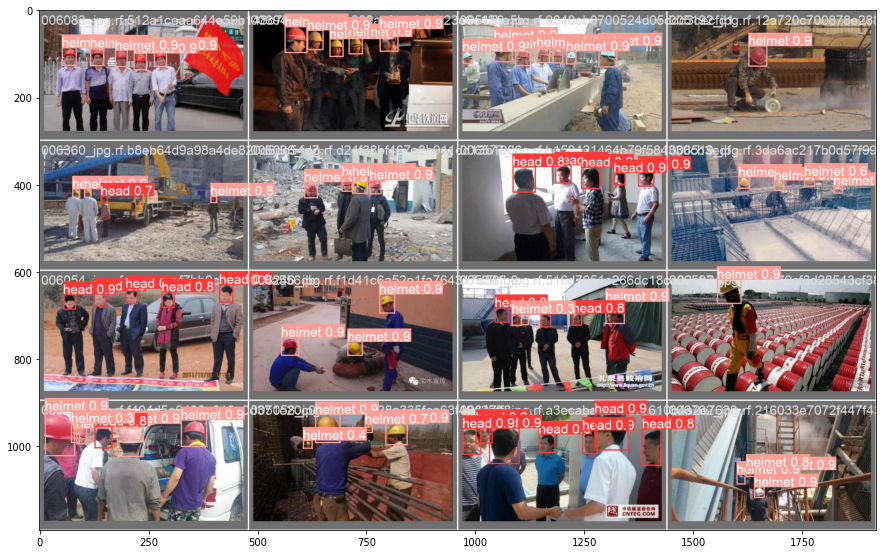

<Figure size 432x288 with 0 Axes>

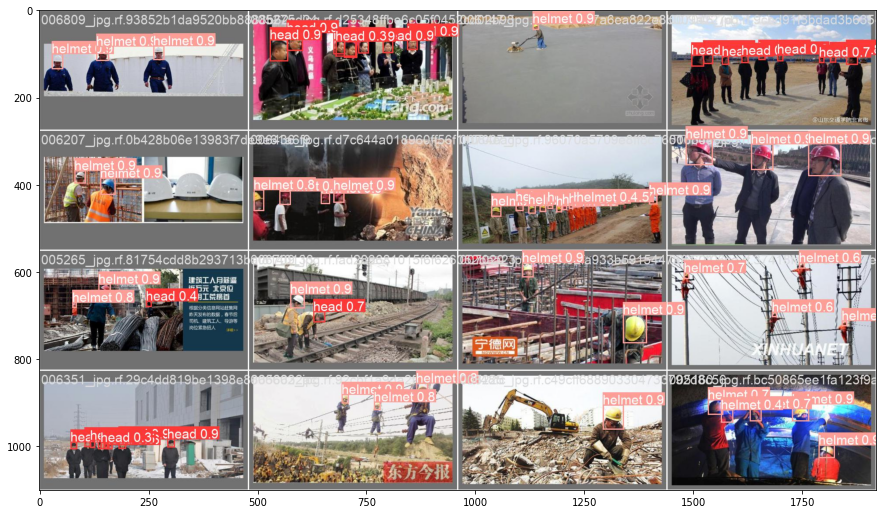

In [22]:
validation_data_predictions()

In [23]:
def inference(data_path,RES_DIR):
  infer_dir_count=len(glob.glob("/content/yolov5/runs/detect/*"))
  print("no_of_previous_inference is {}".format(infer_dir_count))
  INFER_DIR = f"inference_{infer_dir_count+1}"
  !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
  return INFER_DIR

In [24]:
dir_result=inference("/content/yolov5/test1.jpg",'results_1')

no_of_previous_inference is 0
detect: weights=['runs/train/results_1/weights/best.pt'], source=/content/yolov5/test1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-33-g1752768 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/test1.jpg: 480x640 3 helmets, 13.8ms
Speed: 0.5ms pre-process, 13.8ms inference, 1.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/inference_1


In [25]:
def visualize_inference_result(inference_dir):
  images=glob.glob("/content/yolov5/runs/detect/{}/*.jpg".format(inference_dir))
  plt.figure(figsize=(15,15))
  for img in images:
    image=cv2.imread(img)
    plt.figure()
    plt.imshow(image[:,:,::-1])

<Figure size 1080x1080 with 0 Axes>

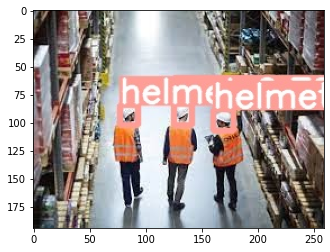

In [26]:
visualize_inference_result(dir_result)